### 1. INTRODUCTION

### Libraries

In [2]:
import os

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

# Map 1 library
import plotly.express as px

# Map 2 libraries
import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon

# Librosa Libraries
import librosa
import librosa.display
import IPython.display as ipd

import sklearn

import warnings
warnings.filterwarnings('ignore')


 ## 2. The .csv files

In [4]:
# Import data
train_csv = pd.read_csv("train.csv")
test_csv = pd.read_csv("test.csv")

# Create some time features
train_csv['year'] = train_csv['date'].apply(lambda x: x.split('-')[0])
train_csv['month'] = train_csv['date'].apply(lambda x: x.split('-')[1])
train_csv['day_of_month'] = train_csv['date'].apply(lambda x: x.split('-')[2])

print("There are {:,} unique bird species in the dataset.".format(len(train_csv['species'].unique())))

There are 264 unique bird species in the dataset.


In [6]:
test_csv

,site,row_id,seconds,audio_id
0,site_1,site_1_0a997dff022e3ad9744d4e7bbf923288_5,5,0a997dff022e3ad9744d4e7bbf923288
1,site_1,site_1_0a997dff022e3ad9744d4e7bbf923288_10,10,0a997dff022e3ad9744d4e7bbf923288
2,site_1,site_1_0a997dff022e3ad9744d4e7bbf923288_15,15,0a997dff022e3ad9744d4e7bbf923288


#### 2.1 Time of the Recording ⏰

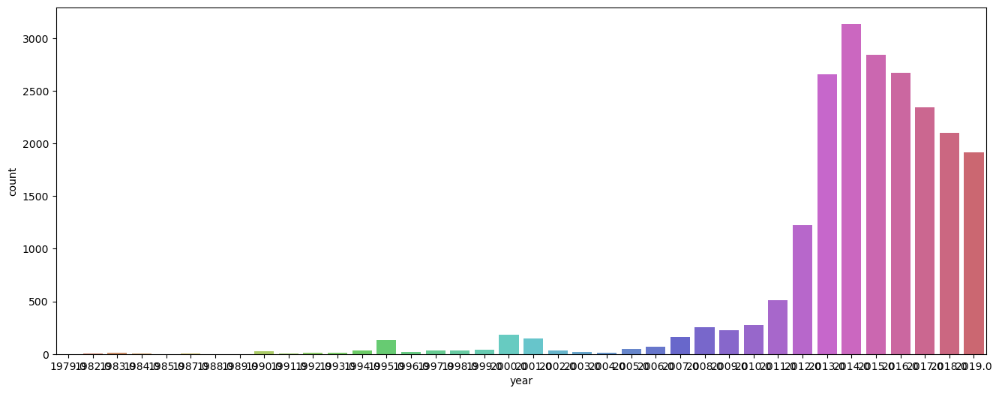

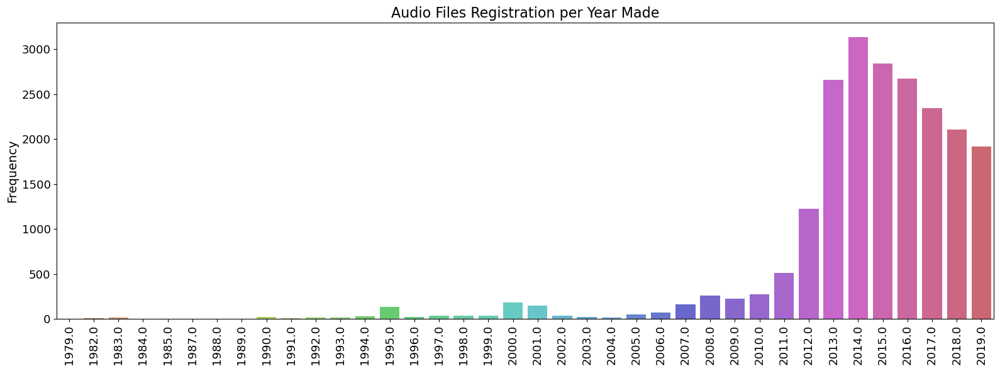

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import seaborn as sns

# Load the dataset
train_csv = pd.read_csv('train.csv')

# Extract year from 'date' column safely
if 'year' not in train_csv.columns:
    if 'date' in train_csv.columns:
        train_csv['date'] = pd.to_datetime(train_csv['date'], errors='coerce')
        train_csv['year'] = train_csv['date'].dt.year
    else:
        raise ValueError("No 'year' or 'date' column found in dataset.")

# Drop rows with invalid or missing dates
train_csv = train_csv.dropna(subset=['year'])

# Create the plot
plt.figure(figsize=(16, 6))
ax = sns.countplot(data=train_csv, x='year', palette="hls")



# Style the plot
plt.title("Audio Files Registration per Year Made", fontsize=16)
plt.xticks(rotation=90, fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel("Frequency", fontsize=14)
plt.xlabel("")
plt.tight_layout()
plt.show()


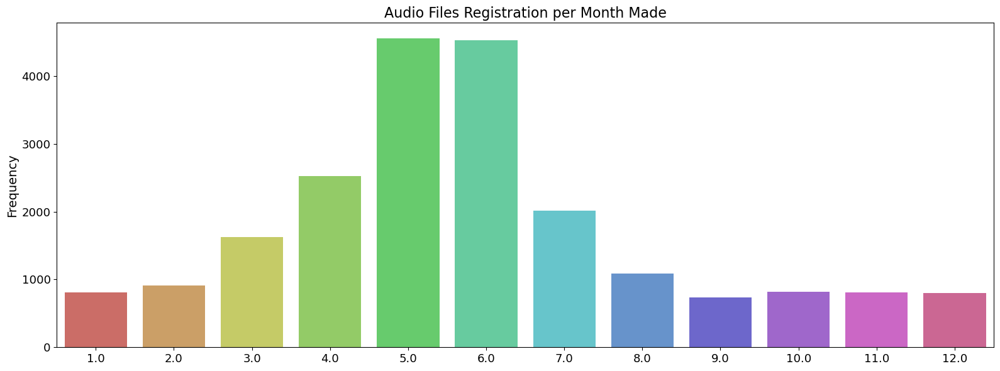

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import seaborn as sns

# Load dataset
train_csv = pd.read_csv('train.csv')

# Extract month from 'date' if not already present
if 'month' not in train_csv.columns:
    if 'date' in train_csv.columns:
        train_csv['date'] = pd.to_datetime(train_csv['date'], errors='coerce')
        train_csv['month'] = train_csv['date'].dt.month
    else:
        raise ValueError("No 'month' or 'date' column found.")

# Drop rows with invalid dates
train_csv = train_csv.dropna(subset=['month'])

# Plotting
plt.figure(figsize=(16, 6))
ax = sns.countplot(data=train_csv, x='month', palette="hls")

# Final plot formatting
plt.title("Audio Files Registration per Month Made", fontsize=16)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel("Frequency", fontsize=14)
plt.xlabel("")
plt.tight_layout()
plt.show()


#### 2.2 The Songs 🎼

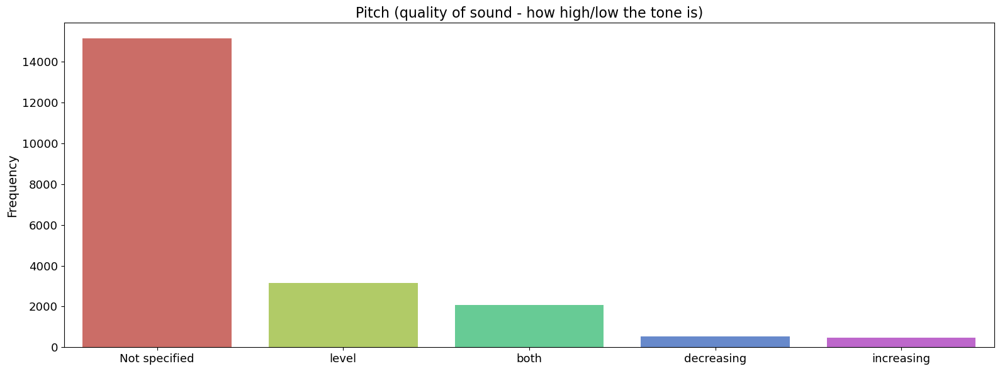

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import seaborn as sns

# Load dataset
train_csv = pd.read_csv('train.csv')

# Validate column presence
if 'pitch' not in train_csv.columns:
    raise ValueError("'pitch' column not found in dataset.")

# Create plot
plt.figure(figsize=(16, 6))
ax = sns.countplot(data=train_csv, x='pitch', palette="hls", order=train_csv['pitch'].value_counts().index)

# Plot formatting
plt.title("Pitch (quality of sound - how high/low the tone is)", fontsize=16)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel("Frequency", fontsize=14)
plt.xlabel("")
plt.tight_layout()
plt.show()


#### Type Column:

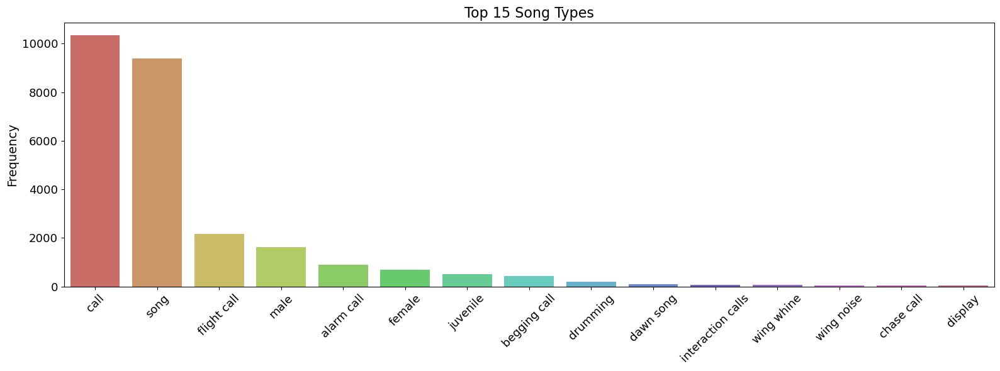

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import seaborn as sns

# Load dataset
train_csv = pd.read_csv('train.csv')

# Handle 'type' column
if 'type' not in train_csv.columns:
    raise ValueError("'type' column not found in dataset.")

# Split, clean, and explode type values
adjusted_type = train_csv['type'].dropna().apply(lambda x: x.split(','))
adjusted_type = adjusted_type.explode()
adjusted_type = adjusted_type.str.strip().str.lower()
adjusted_type = adjusted_type.replace('calls', 'call')

# Convert to DataFrame for plotting
adjusted_type = pd.DataFrame({'type': adjusted_type})

# Get Top 15 types
top_15 = adjusted_type['type'].value_counts().head(15).index.tolist()
data = adjusted_type[adjusted_type['type'].isin(top_15)]

# Plotting
plt.figure(figsize=(16, 6))
ax = sns.countplot(data=data, x='type', palette="hls", order=data['type'].value_counts().index)

# Styling
plt.title("Top 15 Song Types", fontsize=16)
plt.ylabel("Frequency", fontsize=14)
plt.yticks(fontsize=13)
plt.xticks(rotation=45, fontsize=13)
plt.xlabel("")
plt.tight_layout()
plt.show()


#### 2.3 Where is the bird? 📸🔭

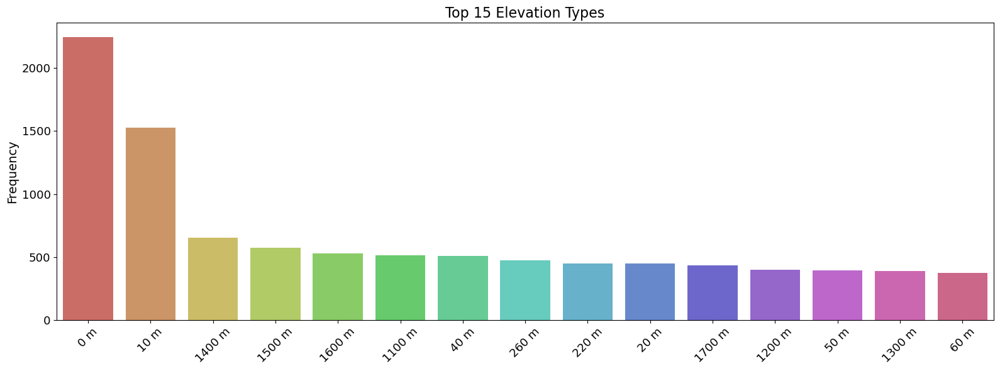

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import seaborn as sns

# Load dataset
train_csv = pd.read_csv('train.csv')

# Check for elevation column
if 'elevation' not in train_csv.columns:
    raise ValueError("'elevation' column not found in dataset.")

# Handle missing values and extract top 15 most frequent elevations
top_15 = train_csv['elevation'].dropna().value_counts().head(15).index.tolist()
data = train_csv[train_csv['elevation'].isin(top_15)]

# Plotting
plt.figure(figsize=(16, 6))
ax = sns.countplot(data=data, x='elevation', palette="hls", order=data['elevation'].value_counts().index)

# Final formatting
plt.title("Top 15 Elevation Types", fontsize=16)
plt.ylabel("Frequency", fontsize=14)
plt.yticks(fontsize=13)
plt.xticks(rotation=45, fontsize=13)
plt.xlabel("")
plt.tight_layout()
plt.show()


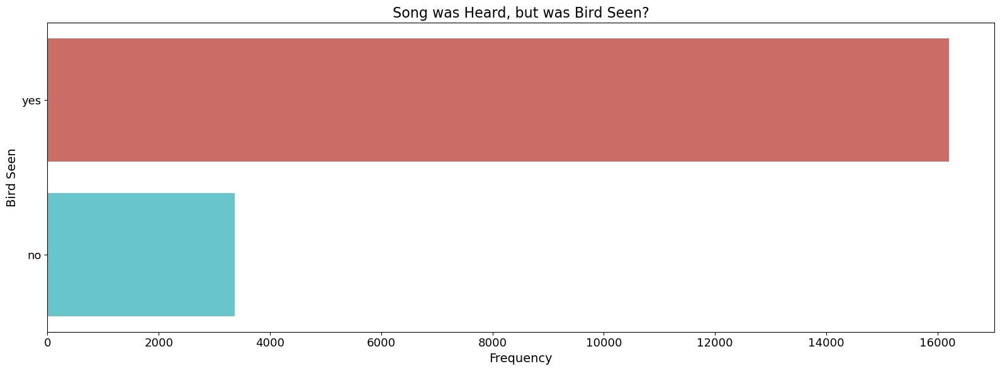

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
train_csv = pd.read_csv('train.csv')

# Check for 'bird_seen' column
if 'bird_seen' not in train_csv.columns:
    raise ValueError("'bird_seen' column not found in dataset.")

# Create data: count values
data = train_csv['bird_seen'].value_counts().reset_index()
data.columns = ['bird_seen', 'count']  # Rename columns for clarity

# Plot
plt.figure(figsize=(16, 6))
ax = sns.barplot(data=data, x='count', y='bird_seen', palette="hls")

# Formatting
plt.title("Song was Heard, but was Bird Seen?", fontsize=16)
plt.xlabel("Frequency", fontsize=14)
plt.ylabel("Bird Seen", fontsize=14)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.tight_layout()
plt.show()


#### 2.4 World View of the Species 🧭🌏

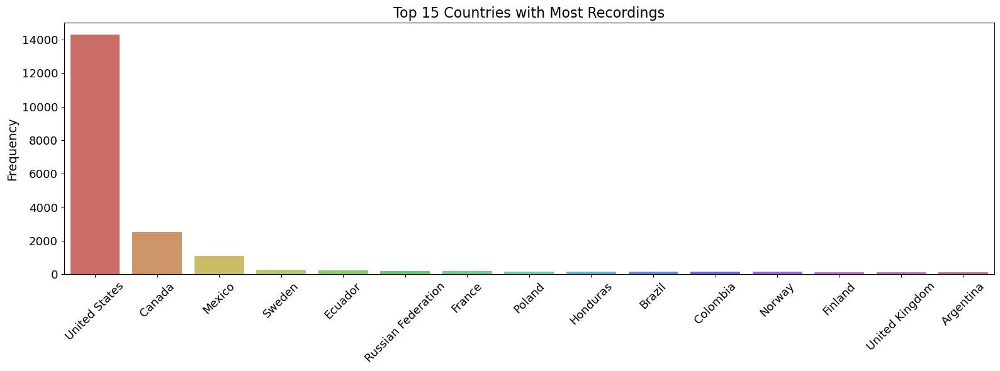

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
train_csv = pd.read_csv('train.csv')

# Check for 'country' column
if 'country' not in train_csv.columns:
    raise ValueError("'country' column not found in dataset.")

# Extract top 15 countries by recording count
top_15 = train_csv['country'].value_counts().head(15).index.tolist()
data = train_csv[train_csv['country'].isin(top_15)]

# Plot
plt.figure(figsize=(16, 6))
ax = sns.countplot(data=data, x='country', palette='hls', order=data['country'].value_counts().index)

# Styling
plt.title("Top 15 Countries with Most Recordings", fontsize=16)
plt.ylabel("Frequency", fontsize=14)
plt.xlabel("")
plt.yticks(fontsize=13)
plt.xticks(rotation=45, fontsize=13)
plt.tight_layout()
plt.show()


#### #2. Map View 🧭

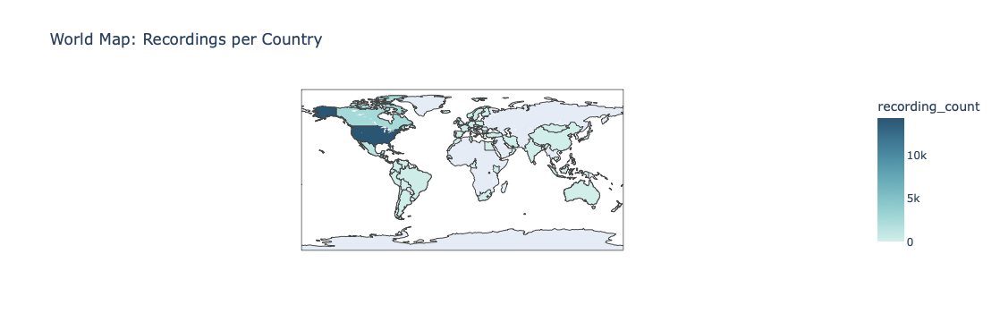

In [30]:
import pandas as pd
import plotly.express as px

# Load your dataset
train_csv = pd.read_csv('train.csv')

# Load country and ISO alpha codes from gapminder
df = px.data.gapminder().query("year==2007")[["country", "iso_alpha"]]

# Merge on country name (inner join to keep only matching countries)
merged = pd.merge(train_csv, df, how="inner", on="country")

# Group by country and count number of recordings (based on species column)
data = merged.groupby(["country", "iso_alpha"])["species"].count().reset_index()
data.rename(columns={"species": "recording_count"}, inplace=True)

# Plot choropleth map
fig = px.choropleth(
    data_frame=data,
    locations="iso_alpha",
    color="recording_count",
    hover_name="country",
    color_continuous_scale=px.colors.sequential.Teal,
    title="World Map: Recordings per Country"
)
fig.show()


#### #3. Another Map! 😄 Where are our birds? 🦜

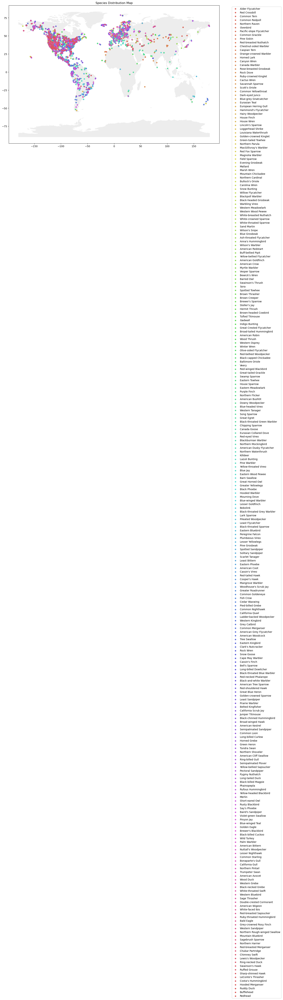

In [46]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Point

# Load CSV data
train_csv = pd.read_csv("train.csv")

# === Load shapefile ===
# Download from: https://www.naturalearthdata.com/downloads/110m-cultural-vectors/
# Extract and point to the .shp file:
world_map = gpd.read_file("ne_110m_admin_0_countries.shp")

# === Clean and prepare data ===
# Filter out rows with unspecified latitudes or longitudes
data = train_csv[(train_csv["latitude"] != "Not specified") & (train_csv["longitude"] != "Not specified")]

# Convert to float
data["latitude"] = data["latitude"].astype(float)
data["longitude"] = data["longitude"].astype(float)

# Create geometry from coordinates
geometry = [Point(xy) for xy in zip(data["longitude"], data["latitude"])]

# Create GeoDataFrame
geo_df = gpd.GeoDataFrame(data, crs="EPSG:4326", geometry=geometry)

# Assign unique ID to each species
species_id = geo_df["species"].value_counts().reset_index()
species_id.columns = ["species", "count"]
species_id.insert(0, "ID", range(len(species_id)))

# Merge with GeoDataFrame
geo_df = pd.merge(geo_df, species_id, how="left", on="species")

# === Plot ===
fig, ax = plt.subplots(figsize=(16, 10))
world_map.plot(ax=ax, alpha=0.4, color="lightgrey")

# Use Seaborn color palette
palette = iter(sns.hls_palette(len(species_id)))

# Plot each species by ID
for i, species in species_id.iterrows():
    geo_df[geo_df["ID"] == i].plot(
        ax=ax, markersize=20, color=next(palette), marker="o", label=species["species"]
    )

plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
plt.title("Species Distribution Map")
plt.tight_layout()
plt.show()


### 3. The Audio Files🔈🔉🔊

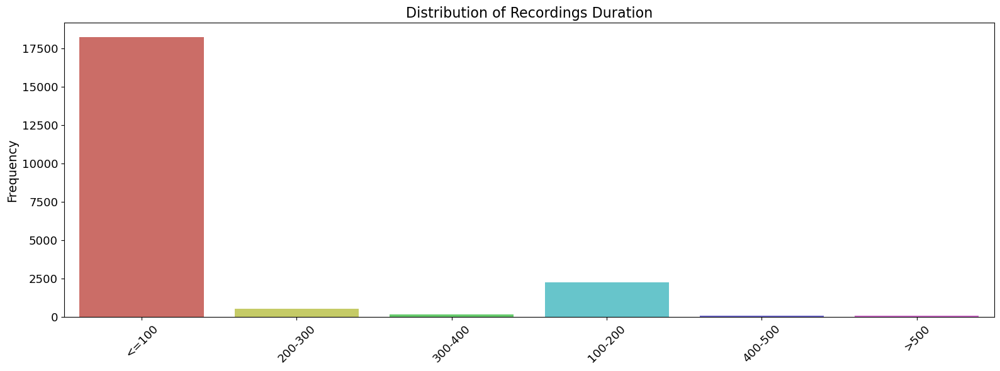

In [48]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your CSV if not already loaded
train_csv = pd.read_csv("train.csv")

# Ensure 'duration' is numeric (some entries may be non-numeric like 'Not specified')
train_csv['duration'] = pd.to_numeric(train_csv['duration'], errors='coerce')

# Creating Interval for *duration* variable
train_csv['duration_interval'] = ">500"
train_csv.loc[train_csv['duration'] <= 100, 'duration_interval'] = "<=100"
train_csv.loc[(train_csv['duration'] > 100) & (train_csv['duration'] <= 200), 'duration_interval'] = "100-200"
train_csv.loc[(train_csv['duration'] > 200) & (train_csv['duration'] <= 300), 'duration_interval'] = "200-300"
train_csv.loc[(train_csv['duration'] > 300) & (train_csv['duration'] <= 400), 'duration_interval'] = "300-400"
train_csv.loc[(train_csv['duration'] > 400) & (train_csv['duration'] <= 500), 'duration_interval'] = "400-500"

# Plotting the distribution
plt.figure(figsize=(16, 6))
ax = sns.countplot(x='duration_interval', data=train_csv, palette="hls")

plt.title("Distribution of Recordings Duration", fontsize=16)
plt.ylabel("Frequency", fontsize=14)
plt.yticks(fontsize=13)
plt.xticks(rotation=45, fontsize=13)
plt.xlabel("")

plt.tight_layout()
plt.show()


### 3.1 Description¶
📌Note:

train_audio: short recording (majority in mp3 format) of INDIVIDUAL birds.
test_audio: recordings took in 3 locations:
Site 1 and Site 2: recordings 10 mins long (mp3) that have labeled a bird every 5 seconds. This is meant to mimic the real life scenario, when you would usually have more than 1 bird (or no bird) singing.
Site 3: recordings labeled at file level (because it is especially hard to have coders trained to label these kind of files)

### 3.2 Duration and File Types 📁

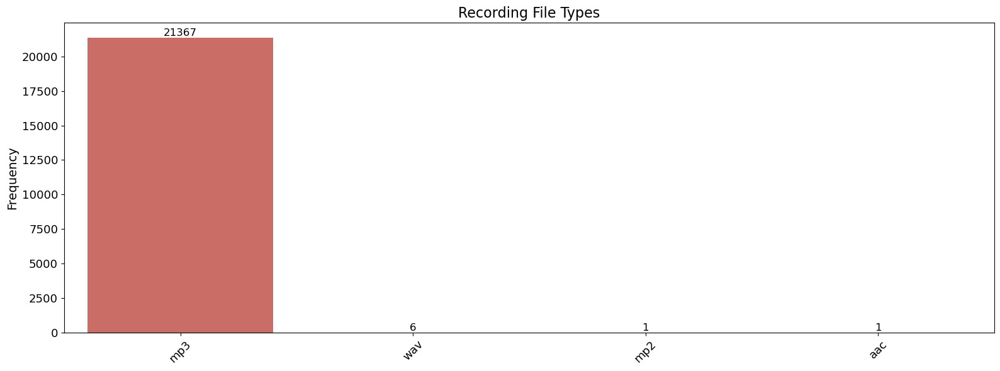

In [50]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Plotting the count of recording file types
plt.figure(figsize=(16, 6))
ax = sns.countplot(
    x='file_type',
    data=train_csv,
    palette="hls",
    order=train_csv['file_type'].value_counts().index
)

# Optional helper function to show values on top of bars
def show_values_on_bars(ax, orientation="v", space=0.4):
    for bar in ax.patches:
        if orientation == "v":
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + space,
                int(bar.get_height()),
                ha='center',
                va='bottom',
                fontsize=12
            )

# Show bar values
show_values_on_bars(ax, orientation="v", space=0.4)

# Plot styling
plt.title("Recording File Types", fontsize=16)
plt.ylabel("Frequency", fontsize=14)
plt.yticks(fontsize=13)
plt.xticks(rotation=45, fontsize=13)
plt.xlabel("")

plt.tight_layout()
plt.show()


#### 3.3 Listening to some Recordings

In [52]:
import os
import pandas as pd

# Define the base directory for audio files
base_dir = "train_audio"  # Update this path if needed

# Ensure ebird_code and filename are strings
train_csv['ebird_code'] = train_csv['ebird_code'].astype(str)
train_csv['filename'] = train_csv['filename'].astype(str)

# Create full path for each file
train_csv['full_path'] = train_csv.apply(
    lambda row: os.path.join(base_dir, row['ebird_code'], row['filename']), axis=1
)

# Sample audio paths for specific bird species
bird_sample_list = ["amered", "cangoo", "haiwoo", "pingro", "vesspa"]
bird_samples = {}

for bird in bird_sample_list:
    try:
        sample_path = train_csv[train_csv['ebird_code'] == bird].sample(1, random_state=33)['full_path'].values[0]
        bird_samples[bird] = sample_path
    except IndexError:
        bird_samples[bird] = None  # Handle cases where the bird code is not found

# Optional: Print the sampled paths
for bird, path in bird_samples.items():
    print(f"{bird}: {path}")


amered: train_audio/amered/XC308434.mp3
cangoo: train_audio/cangoo/XC368732.mp3
haiwoo: train_audio/haiwoo/XC325680.mp3
pingro: train_audio/pingro/XC143411.mp3
vesspa: train_audio/vesspa/XC322492.mp3


In [60]:
Audio(bird_samples['amered'])

In [62]:
Audio(bird_samples['cangoo'])

In [64]:
Audio(bird_samples['haiwoo'])

In [66]:
Audio(bird_samples['pingro'])

In [68]:
Audio(bird_samples['vesspa'])

#### 3.4 Extracting Features from Sounds 🔓
📌The audio data is composed by:

Sound: sequence of vibrations in varying pressure strengths (y)
Sample Rate: (sr) is the number of samples of audio carried per second, measured in Hz or kHz

In [70]:
import librosa
import numpy as np

# Load audio file from dictionary
y, sr = librosa.load(bird_samples['vesspa'], sr=None)  # sr=None keeps the original sample rate

# Display audio info
print('y:', y[:10], '...')  # print only the first few samples
print('y shape:', np.shape(y))
print('Sample Rate (Hz):', sr)

# Verify length of the audio in seconds
audio_length = len(y) / sr
print('Audio Duration (seconds):', audio_length)


y: [-3.5657757e-04 -1.2074076e-03 -6.9642020e-04  3.0102659e-04
  1.1209582e-03  1.3055354e-03  1.5038284e-03  1.7707967e-03
  7.9874066e-05 -2.5916314e-03] ...
y shape: (3089909,)
Sample Rate (Hz): 44100
Audio Duration (seconds): 70.06596371882087


In [74]:
 import librosa

# Trim leading and trailing silence from the audio signal
audio_file, _ = librosa.effects.trim(y)

# Display trimmed audio details
print('Trimmed Audio:', audio_file[:10], '...')  # show only the first few samples
print('Trimmed Audio shape:', np.shape(audio_file))


Trimmed Audio: [-3.5657757e-04 -1.2074076e-03 -6.9642020e-04  3.0102659e-04
  1.1209582e-03  1.3055354e-03  1.5038284e-03  1.7707967e-03
  7.9874066e-05 -2.5916314e-03] ...
Trimmed Audio shape: (3089909,)


In [76]:
import librosa

# Dictionary to store trimmed audio data and sample rates
audio_data = {}

# Process each bird sample
for bird in ['amered', 'cangoo', 'haiwoo', 'pingro', 'vesspa']:
    y, sr = librosa.load(bird_samples[bird], sr=None)
    trimmed_audio, _ = librosa.effects.trim(y)
    audio_data[bird] = {
        'y': y,
        'sr': sr,
        'trimmed': trimmed_audio
    }

# Example: Access trimmed audio for amered
print('Trimmed audio for amered:', audio_data['amered']['trimmed'][:10], '...')
print('Shape:', audio_data['amered']['trimmed'].shape)
print('Sample Rate:', audio_data['amered']['sr'])


Trimmed audio for amered: [ 4.9189988e-05 -1.6242833e-04 -2.1734170e-04 -3.6117731e-04
 -9.2276587e-04 -1.1342808e-03 -9.6025680e-05  1.2674090e-03
  1.3039645e-03  9.6788477e-05] ...
Shape: (227215,)
Sample Rate: 44100


#### #1. Sound Waves🌊 (2D Representation)

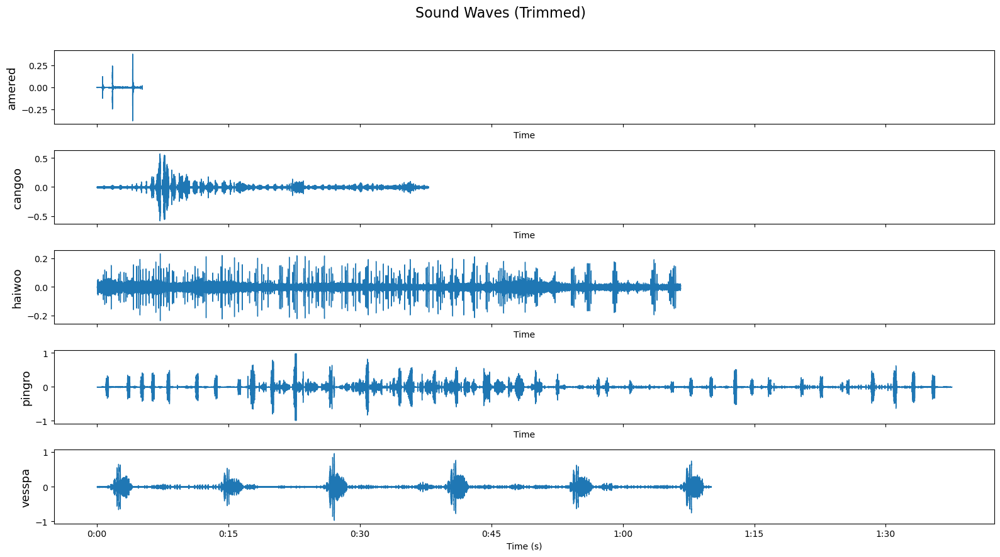

In [82]:
import matplotlib.pyplot as plt
import librosa.display

# Plot only the trimmed audio waveforms
fig, ax = plt.subplots(5, figsize=(16, 9), sharex=True)
fig.suptitle('Sound Waves (Trimmed)', fontsize=16)

for i, bird in enumerate(bird_sample_list):
    librosa.display.waveshow(y=audio_data[bird]['trimmed'], sr=audio_data[bird]['sr'], ax=ax[i])
    ax[i].set_ylabel(bird, fontsize=13)

plt.xlabel("Time (s)")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()




#### #2. Fourier Transform 🥁

📌Note: Function that gets a signal in the time domain as input, and outputs its decomposition into frequencies. Transform both the y-axis (frequency) to log scale, and the “color” axis (amplitude) to Decibels, which is approx. the log scale of amplitudes.

In [84]:
import numpy as np
import librosa

# FFT parameters
n_fft = 2048
hop_length = 512

# Dictionary to store STFT results
stft_data = {}

# Compute STFT magnitude for each bird
for bird in bird_sample_list:
    trimmed_audio = audio_data[bird]['trimmed']
    stft = np.abs(librosa.stft(trimmed_audio, n_fft=n_fft, hop_length=hop_length))
    stft_data[bird] = stft


In [88]:
for bird in bird_sample_list:
    print(f'Shape of STFT ({bird}):', stft_data[bird].shape)


Shape of STFT (amered): (1025, 444)
Shape of STFT (cangoo): (1025, 3545)
Shape of STFT (haiwoo): (1025, 5735)
Shape of STFT (pingro): (1025, 9144)
Shape of STFT (vesspa): (1025, 6035)


#### #3. Spectrogram 🎷

📌Note:

What is a spectrogram? A spectrogram is a visual representation of the spectrum of frequencies of a signal as it varies with time. When applied to an audio signal, spectrograms are sometimes called sonographs, voiceprints, or voicegrams (wiki).
Here we convert the frequency axis to a logarithmic one.

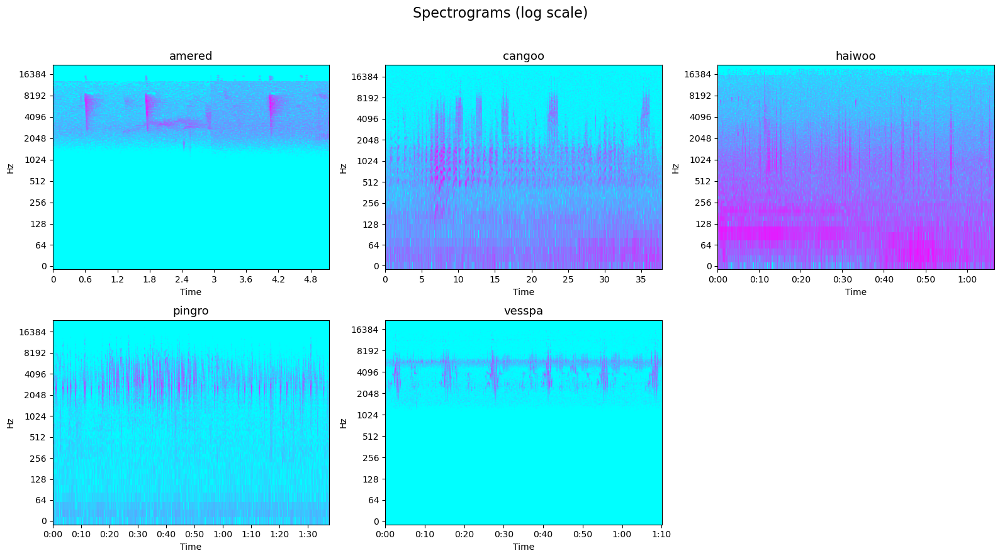

In [90]:
import matplotlib.pyplot as plt
import librosa.display

# Convert amplitude spectrograms to decibel (dB) scale
db_data = {}
for bird in bird_sample_list:
    db_data[bird] = librosa.amplitude_to_db(stft_data[bird], ref=np.max)

# === PLOT ===
fig, ax = plt.subplots(2, 3, figsize=(16, 9))
fig.suptitle('Spectrograms (log scale)', fontsize=16)

# Remove unused subplot
fig.delaxes(ax[1, 2])

# Display spectrograms
for idx, bird in enumerate(bird_sample_list):
    row, col = divmod(idx, 3)
    librosa.display.specshow(db_data[bird],
                              sr=audio_data[bird]['sr'],
                              hop_length=512,
                              x_axis='time',
                              y_axis='log',
                              cmap='cool',
                              ax=ax[row, col])
    ax[row, col].set_title(bird, fontsize=13)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


#### #4. Mel Spectrogram 🎷

📌Note: The Mel Scale, mathematically speaking, is the result of some non-linear transformation of the frequency scale. The Mel Spectrogram is a normal Spectrogram, but with a Mel Scale on the y axis.

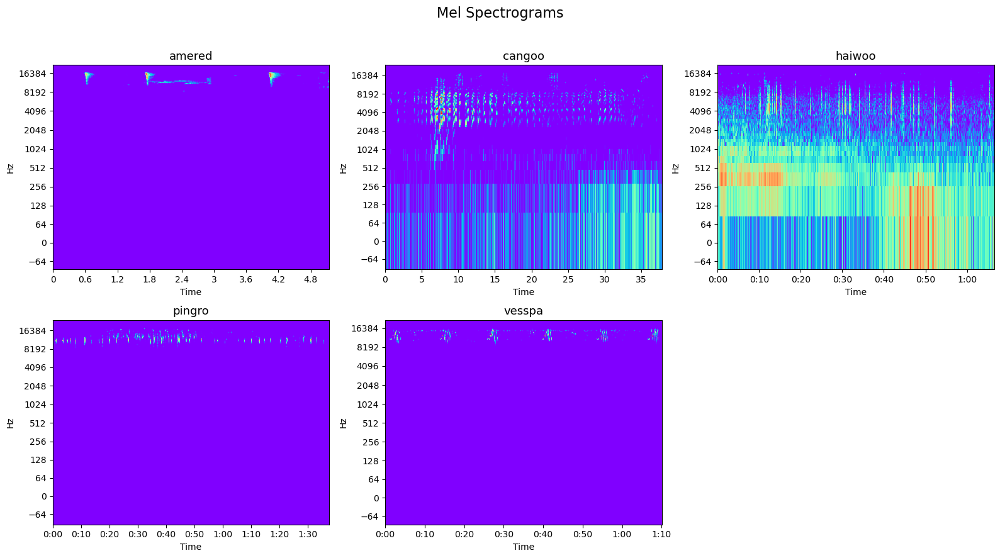

In [92]:
import matplotlib.pyplot as plt
import librosa.display

# Create Mel Spectrograms in dB scale
mel_data = {}

for bird in bird_sample_list:
    y = audio_data[bird]['trimmed']  # use original (non-trimmed) audio or change to 'trimmed' if preferred
    sr = audio_data[bird]['sr']
    
    S = librosa.feature.melspectrogram(y=y, sr=sr, hop_length=hop_length)
    S_DB = librosa.amplitude_to_db(S, ref=np.max)
    
    mel_data[bird] = S_DB

# === PLOT ===
fig, ax = plt.subplots(2, 3, figsize=(16, 9))
fig.suptitle('Mel Spectrograms', fontsize=16)
fig.delaxes(ax[1, 2])  # Remove extra axis

for idx, bird in enumerate(bird_sample_list):
    row, col = divmod(idx, 3)
    librosa.display.specshow(mel_data[bird],
                              sr=audio_data[bird]['sr'],
                              hop_length=hop_length,
                              x_axis='time',
                              y_axis='log',
                              cmap='rainbow',
                              ax=ax[row, col])
    ax[row, col].set_title(bird, fontsize=13)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


#### #5. Zero Crossing Rate 🚷

📌Note: the rate at which the signal changes from positive to negative or back.

In [94]:
# Compute zero crossings for each bird's trimmed audio
zero_crossings = {}

for bird in bird_sample_list:
    y = audio_data[bird]['trimmed']  # use trimmed audio
    zero_crossings[bird] = librosa.zero_crossings(y, pad=False)

# Print results
for bird in bird_sample_list:
    print(f"{bird} change rate is {sum(zero_crossings[bird]):,}")


amered change rate is 58,677
cangoo change rate is 116,220
haiwoo change rate is 131,900
pingro change rate is 741,970
vesspa change rate is 704,050


#### #6. Harmonics and Perceptrual 🎹

📌Note:

Harmonics are characteristichs that represent the sound color
Perceptrual shock wave represents the sound rhythm and emotion

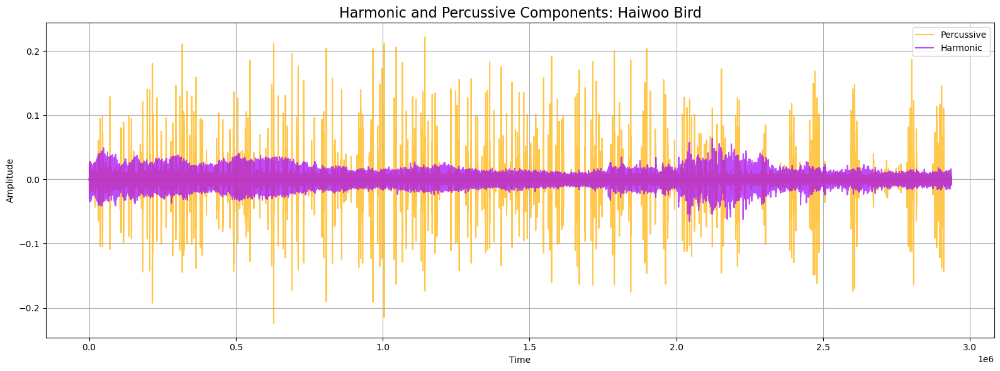

In [96]:
# Perform HPSS on trimmed audio of 'haiwoo'
y_harm_haiwoo, y_perc_haiwoo = librosa.effects.hpss(audio_data['haiwoo']['trimmed'])

# Plot the harmonic and percussive components
plt.figure(figsize=(16, 6))
plt.plot(y_perc_haiwoo, color='#FFB100', alpha=0.7)
plt.plot(y_harm_haiwoo, color='#A300F9', alpha=0.7)
plt.legend(["Percussive", "Harmonic"])
plt.title("Harmonic and Percussive Components: Haiwoo Bird", fontsize=16)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.grid(True)
plt.tight_layout()
plt.show()


#### #7. Spectral Centroid 🎯

📌Note: Indicates where the ”centre of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound.

In [124]:
# Assuming train_csv is already loaded and contains columns 'ebird_code' and 'filename'
# Define the base directory to audio files
base_dir = 'train_audio/'
train_csv['full_path'] = base_dir + train_csv['ebird_code'] + '/' + train_csv['filename']

# Now sample the cangoo bird audio file
cangoo = train_csv[train_csv['ebird_code'] == "cangoo"].sample(1, random_state=33)['full_path'].values[0]


In [126]:
y_cangoo, sr_cangoo = librosa.load(cangoo)
audio_cangoo, _ = librosa.effects.trim(y_cangoo)


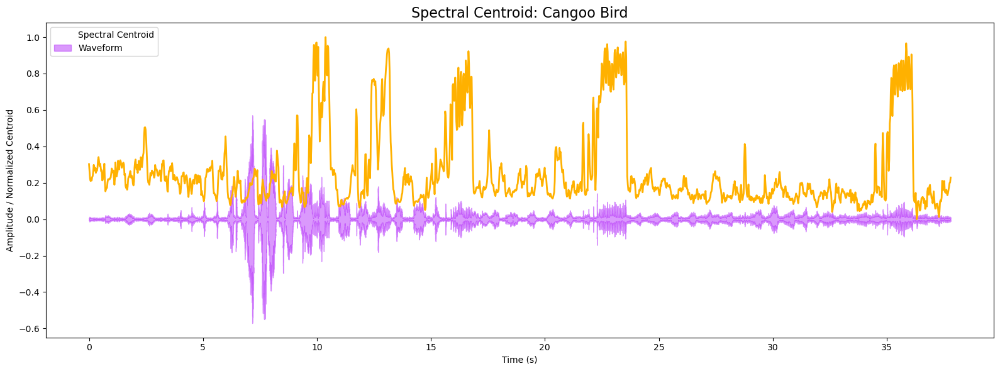

In [128]:
import librosa.display
import matplotlib.pyplot as plt
import sklearn

# Function to normalize data
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

# Calculate spectral centroids
spectral_centroids = librosa.feature.spectral_centroid(y=audio_cangoo, sr=sr_cangoo)[0]

# Time variable for centroids
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames, sr=sr_cangoo)

# Plot waveform and spectral centroid
plt.figure(figsize=(16, 6))
librosa.display.waveshow(audio_cangoo, sr=sr_cangoo, alpha=0.4, color='#A300F9')
plt.plot(t, normalize(spectral_centroids), color='#FFB100', lw=2)
plt.legend(["Spectral Centroid", "Waveform"])
plt.title("Spectral Centroid: Cangoo Bird", fontsize=16)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude / Normalized Centroid")
plt.tight_layout()
plt.show()


#### #8. Chroma Frequencies

📌Note: Chroma features are an interesting and powerful representation for music audio in which the entire spectrum is projected onto 12 bins representing the 12 distinct semitones (or chromas) of the musical octave.

In [132]:
vesspa_path = train_csv[train_csv['ebird_code'] == 'vesspa'].sample(1, random_state=33)['full_path'].values[0]


In [134]:
import librosa

y_vesspa, sr_vesspa = librosa.load(vesspa_path)
audio_vesspa, _ = librosa.effects.trim(y_vesspa)


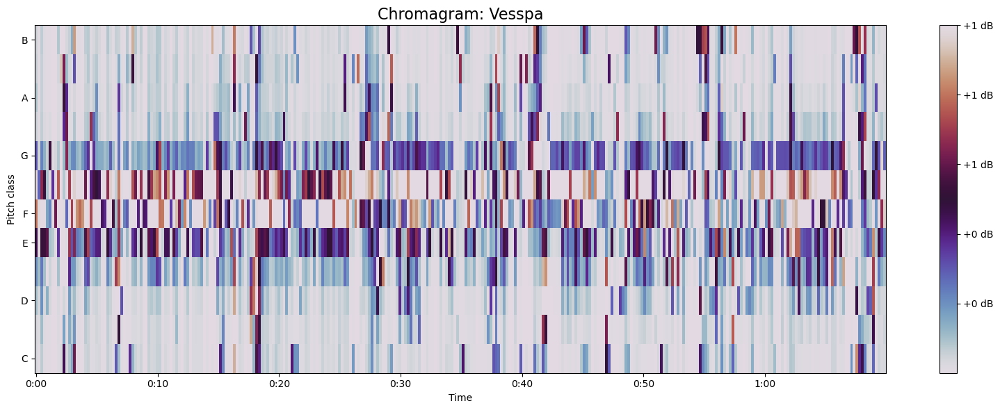

In [136]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Load the audio file (update the path if needed)
vesspa_path = train_csv[train_csv['ebird_code'] == 'vesspa'].sample(1, random_state=33)['full_path'].values[0]
y_vesspa, sr_vesspa = librosa.load(vesspa_path)

# Trim leading/trailing silence
audio_vesspa, _ = librosa.effects.trim(y_vesspa)

# Define hop_length (granularity)
hop_length = 5000

# Compute the chromagram
chromagram = librosa.feature.chroma_stft(y=audio_vesspa, sr=sr_vesspa, hop_length=hop_length)

# Plot the chromagram
plt.figure(figsize=(16, 6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='twilight')
plt.title("Chromagram: Vesspa", fontsize=16)
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
plt.show()


#### #9.  Spectral Rolloff 🥏

📌Note: Is a measure of the shape of the signal. It represents the frequency below which a specified percentage of the total spectral energy (e.g. 85%) lies.

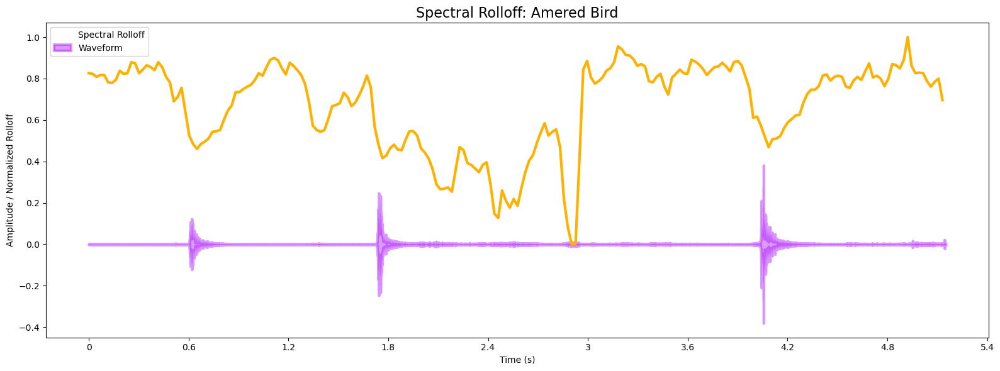

In [14]:
# Extract audio and sample rate for "amered"
audio_amered = audio_data["amered"]
sr_amered = sr_data["amered"]

# Compute spectral rolloff
spectral_rolloff = librosa.feature.spectral_rolloff(y=audio_amered, sr=sr_amered)[0]

# Compute time axis
frames = range(len(spectral_rolloff))
t = librosa.frames_to_time(frames, sr=sr_amered)

# Normalize function
def normalize(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x) + 1e-6)

# Plot
plt.figure(figsize=(16, 6))
librosa.display.waveshow(audio_amered, sr=sr_amered, alpha=0.4, color='#A300F9', lw=3)
plt.plot(t, normalize(spectral_rolloff), color='#FFB100', lw=3)
plt.legend(["Spectral Rolloff", "Waveform"])
plt.title("Spectral Rolloff: Amered Bird", fontsize=16)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude / Normalized Rolloff")
plt.tight_layout()
plt.show()
